---
title: Crossover analysis
description: Using xOPR to automatically find radar crossovers
date: 2025-09-09
---

Radar sounder crossover analysis refers to finding crossing points between radar flight lines and analyzing differences between the radar data at the same point. Differences can arise from many factors. Often, crossing flight paths are at (nearly) perpendicular angles. Because the along-track and across-track beamwidth of most radar systems is very different, this different imaging geometry can lead to differences in the radar data. These differences are most pronouned over rough terrain, where off-nadir clutter may show up differently in coicident data collected along different angles. Temporal changes, changes in radar systems, and errors in picking the location of the surface or bed are other sources of differences in crossover analysis.

In this notebook, we demonstratate how to automatically find and analyze radar crossovers. To do this, we will

1. Find STAC items representing radar data within a geographic region.
2. Use the STAC item geometry to identify points where the radar flight paths cross (crossover points).
3. Selectively load layer information to make a map of the differences in WGS84 elevation between the bed picks at each crossover point. (This step is parallelized using Dask.)
4. Interactively load and plot radar data round selected crossover points to see what's happening.

In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
import xarray as xr
import geoviews as gv
import geoviews.feature as gf
import cartopy.crs as ccrs
import cartopy.io.shapereader as shapereader
import matplotlib.pyplot as plt
import shapely.geometry
import scipy.constants
import geopandas as gpd
from tqdm import tqdm

import requests
import time

import xopr

import holoviews as hv
import hvplot.xarray
import hvplot.pandas
hvplot.extension('bokeh')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# Useful background features for maps
background_map = gf.ocean.opts(projection=ccrs.SouthPolarStereo(), scale='50m') * gf.coastline.opts(projection=ccrs.SouthPolarStereo(), scale='50m')

In [4]:
# Establish an OPR session
# You'll probably want to set a cache directory if you're running this locally to speed
# up subsequent requests. You can do other things like customize the STAC API endpoint,
# but you shouldn't need to do that for most use cases.
opr = xopr.OPRConnection(cache_dir="/tmp")

# Or you can open a connection without a cache directory (for example, if you're parallelizing
# this on a cloud cluster without persistent storage).
#opr = xopr.OPRConnection()

### Step 1: Finding radar lines

For this notebook, we'll experiment with finding data by geographic region. xOPR includes a helper module `xopr.geometry` with some useful utilities. You can call `xopr.geometry.get_antarctic_regions` to select one or more regions from the [MEaSUREs Antarctic Boundaries](https://nsidc.org/data/nsidc-0709/versions/2) dataset. Below, we plot all of the regions to give you some options for what to try. Mouse over each region to see its name.

In [5]:
regions_df = xopr.geometry.get_antarctic_regions(merge_regions=False).to_crs('EPSG:3031')
regions_df.hvplot(frame_width=600, aspect='equal', hover_cols=['NAME'], c='TYPE')

:Polygons   [x,y]   (TYPE,NAME)

For our demonstration, we'll use David Glacier, but feel free to trade this out for other locations and experiment.

In [6]:
region = xopr.geometry.get_antarctic_regions(name="David", merge_regions=True, simplify_tolerance=100)
region_projected = xopr.geometry.project_geojson(region, source_crs='EPSG:4326', target_crs="EPSG:3031")

region_hv = hv.Polygons([region_projected]).opts(
    color='green',
    line_color='black',
    fill_alpha=0.5)

(background_map * region_hv).opts(aspect='equal')

:Overlay
   .Ocean.I     :Feature   [Longitude,Latitude]
   .Coastline.I :Feature   [Longitude,Latitude]
   .Polygons.I  :Polygons   [x,y]

In [7]:
stac_items_df = opr.query_frames(geometry=region, date_range="2021-01-01T00:00:00Z/2025-06-01T00:00:00Z") # Can also add a date range: date_range="2020-01-01T00:00:00Z/2024-01-01T00:00:00Z"
stac_items_df = stac_items_df.to_crs('EPSG:3031')

print(f"Found {len(stac_items_df)} frames across {stac_items_df['collection'].nunique()} collections:")
stac_items_df.groupby('collection').size()

Found 34 frames across 2 collections:


collection
2022_Antarctica_BaslerMKB    17
2023_Antarctica_BaslerMKB    17
dtype: int64

In [9]:
stac_items_df

,collection,geometry,properties,assets,bbox,id,links,stac_extensions,stac_version,type
stac_item_id,,,,,,,,,,
Data_20221210_01_009,2022_Antarctica_BaslerMKB,"LINESTRING (558620.075 -1337938.719, 561007.63...",{'datetime': '2022-12-10T02:53:40.184514+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[156.7428855250563, -76.7133057875265, 157.338...",Data_20221210_01_009,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_010,2022_Antarctica_BaslerMKB,"LINESTRING (591005.955 -1375110.318, 600742.01...",{'datetime': '2022-12-10T03:03:30.064582+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[156.17389554660153, -76.28773934810474, 156.7...",Data_20221210_01_010,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_011,2022_Antarctica_BaslerMKB,"LINESTRING (623562.45 -1412044.91, 626287.131 ...",{'datetime': '2022-12-10T03:13:22.521747+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[155.6277390464226, -75.86250057156778, 156.17...",Data_20221210_01_011,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_012,2022_Antarctica_BaslerMKB,"LINESTRING (656407.049 -1448883.817, 658237.91...",{'datetime': '2022-12-10T03:23:10.293642+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[155.15022247265583, -75.43605250898565, 155.6...",Data_20221210_01_012,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_013,2022_Antarctica_BaslerMKB,"LINESTRING (688445.581 -1486520.606, 694025.14...",{'datetime': '2022-12-10T03:32:54.916374+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[155.01452836989398, -75.03974842638338, 155.7...",Data_20221210_01_013,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_014,2022_Antarctica_BaslerMKB,"LINESTRING (670645.012 -1490438.376, 664516.46...",{'datetime': '2022-12-10T03:42:55.037157+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[155.77392530174288, -75.3876140539607, 156.87...",Data_20221210_01_014,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_015,2022_Antarctica_BaslerMKB,"LINESTRING (626769.558 -1467741.947, 623972.10...",{'datetime': '2022-12-10T03:52:52.897840+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[156.87607348981462, -75.73734713605742, 157.9...",Data_20221210_01_015,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221210_01_016,2022_Antarctica_BaslerMKB,"LINESTRING (583462.095 -1443954.539, 563385.56...",{'datetime': '2022-12-10T04:03:08.911073+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[157.99772845532647, -76.07989396593256, 159.1...",Data_20221210_01_016,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature
Data_20221212_01_009,2022_Antarctica_BaslerMKB,"LINESTRING (545331.245 -1322788.424, 565188.34...",{'datetime': '2022-12-12T01:56:34.532978+00:00...,{'CSARP_standard': {'href': 'https://data.cres...,"[156.98188579066692, -76.8867401832618, 157.59...",Data_20221212_01_009,[],[https://stac-extensions.github.io/file/v2.1.0...,1.1.0,Feature


In [8]:
flight_lines = stac_items_df.hvplot(by='collection')
(background_map * region_hv * flight_lines).opts(frame_width=500, aspect='equal', active_tools=['pan', 'wheel_zoom'])

:Overlay
   .Ocean.I     :Feature   [Longitude,Latitude]
   .Coastline.I :Feature   [Longitude,Latitude]
   .Polygons.I  :Polygons   [x,y]
   .NdOverlay.I :NdOverlay   [collection]
      :Path   [x,y]

### Step 2: Identify crossover points

xOPR includes a helper function to identify crossover points. Feel free to poke into the code and take a look. It takes advantage of GeoPandas's spatial join (`sjoin`) function, so it's actually quite concise.

```{tip} Note about runtimes
This notebook can take quite some time to run if you have a lot of crossover points. It's parallelized with dask, so exactly how long will depend on your setup and it should be relatively efficient. If you're here to learn the library and experiment, we recommend limiting your queries to 100 or so intersection points. Some ways that you can limit the number of intersection points include:
- Choose a smaller geographic region or limit the date range of your query (above)
- Filter the intersections dataframe by the crossing angle -- this will filter out nearly coincident lines which produce a lot of crossovers: `intersections = intersections[intersections['crossing_angle'] > 45]`
- Just artificially limit the number of crossovers: `intersections = intersections.iloc[:100]`
```

In [9]:
intersections = xopr.find_intersections(stac_items_df, calculate_crossing_angles=True)

intersections = intersections[intersections['crossing_angle'] > 2] # Filter out nearly coincident crossings

print(f"Found {len(intersections)} crossover points between flight lines.")
(background_map * region_hv * flight_lines * intersections.hvplot(label='Intersection Points', c='crossing_angle')).opts(frame_width=500, aspect='equal', active_tools=['pan', 'wheel_zoom'])

/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Found 29 crossover points between flight lines.


:Overlay
   .Ocean.I                    :Feature   [Longitude,Latitude]
   .Coastline.I                :Feature   [Longitude,Latitude]
   .Polygons.I                 :Polygons   [x,y]
   .NdOverlay.I                :NdOverlay   [collection]
      :Path   [x,y]
   .Points.Intersection_Points :Points   [x,y]   (crossing_angle)

Zoom in and check out the plot above. Every identified crossover point has a blue dot over it. The blue dots are shaded by the crossing angle. You'll see that nearly coincident lines will have a large number of low crossing angles wheras most other crossovers are at angles closer to 90 degrees.

The cell below shows you what the result of `xopr.find_intersections()` looks like. It returns a GeoDataFrame where every column from the intersecting frames is preserved, with suffixes _1 and _2 to distinguish them.

In [10]:
intersections.head()

,id_1,id_2,intersection_geometry,collection_1,collection_2,geom_1,geom_2,opr:date_1,opr:date_2,opr:segment_1,opr:segment_2,opr:frame_1,opr:frame_2,crossing_angle
5,Data_20221210_01_009,Data_20231212_02_009,POINT (565036.316 -1345061.106),2022_Antarctica_BaslerMKB,2023_Antarctica_BaslerMKB,"LINESTRING (558620.075 -1337938.719, 561007.63...","LINESTRING (560494.644 -1338517.617, 563691.42...",20221210,20231212,1,2,9,9,3.268261
7,Data_20221210_01_009,Data_20221212_01_009,POINT (562734.434 -1342555.301),2022_Antarctica_BaslerMKB,2022_Antarctica_BaslerMKB,"LINESTRING (558620.075 -1337938.719, 561007.63...","LINESTRING (545331.245 -1322788.424, 565188.34...",20221210,20221212,1,1,9,9,2.322595
8,Data_20221210_01_010,Data_20221212_01_011,POINT (620311.704 -1408331.142),2022_Antarctica_BaslerMKB,2022_Antarctica_BaslerMKB,"LINESTRING (591005.955 -1375110.318, 600742.01...","LINESTRING (610362.465 -1396926.451, 616100.88...",20221210,20221212,1,1,10,11,2.968668
9,Data_20221210_01_010,Data_20231212_02_010,POINT (618483.328 -1406404.872),2022_Antarctica_BaslerMKB,2023_Antarctica_BaslerMKB,"LINESTRING (591005.955 -1375110.318, 600742.01...","LINESTRING (592135.407 -1376288.409, 624621.02...",20221210,20231212,1,2,10,10,2.325487
10,Data_20221210_01_010,Data_20231212_02_010,POINT (605727.82 -1391824.945),2022_Antarctica_BaslerMKB,2023_Antarctica_BaslerMKB,"LINESTRING (591005.955 -1375110.318, 600742.01...","LINESTRING (592135.407 -1376288.409, 624621.02...",20221210,20231212,1,2,10,10,3.567186


### Step 3: Load layer data and find the different in bed elevation

Depending on how many intersection points you have, loading all of the layer data associated with each crossover may take quite some time. Luckily, this process can be parallelized fairly efficiently, so we'll use Dask to make this run a bit faster. Take a look at the "Search and Scaling" notebook for some tips on working with Dask.

This is a good time to check that you have a reasonable number of intersection points if you've modified anything. We recommend starting with about 100 or fewer intersection points so that this won't take more than about 5 minutes to run.

In [11]:
import dask
import dask.delayed as delayed
from dask import compute
from dask.distributed import LocalCluster

client = LocalCluster().get_client()
client

/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43411 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:43411/status,
Dashboard: http://127.0.0.1:43411/status,Workers: 7
Total threads: 28,Total memory: 31.03 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40585,Workers: 7
Dashboard: http://127.0.0.1:43411/status,Total threads: 28
Started: Just now,Total memory: 31.03 GiB
Comm: tcp://127.0.0.1:44403,Total threads: 4
Dashboard: http://127.0.0.1:43545/status,Memory: 4.43 GiB
Nanny: tcp://127.0.0.1:33393,


2026-01-20 14:18:03,150 - distributed.dashboard.components.scheduler - ERROR - Circle(id='9ba12084-e8ed-4206-b4c4-b04c7c8f9675', ...).radius doesn't have a value set
Traceback (most recent call last):
  File "/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/distributed/utils.py", line 811, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/distributed/dashboard/components/scheduler.py", line 4802, in profile_doc
    doc.add_root(prof.root)
  File "/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/bokeh/document/document.py", line 331, in add_root
    with self.models.freeze():
         ^^^^^^^^^^^^^^^^^^^^
  File "/home/m484s199/miniconda3/envs/py312/lib/python3.12/contextlib.py", line 144, in __exit__
    next(self.gen)
  File "/home/m484s199/miniconda3/envs/py312/lib/python3.12/site-packages/bokeh/document/models.py", line 135, in freeze
    self._pop_f

By default, Dask will start a server at `http://127.0.0.1:8787/status`. If it can't use that port for some reason, the cell above should print out an alternative port. Visiting this status page is optional, but it will tell you about the progress of your job.

In [12]:
@delayed
def safe_get_layers_db(stac_item, opr=xopr.opr_access.OPRConnection()):
    try:
        retries = 1
        backoff_time = 5
        backoff_jitter = 30
        while retries > 0:
            try:
                return opr.get_layers_db(stac_item)
            except requests.exceptions.RequestException as e:
                sleep_time = backoff_time + np.random.uniform(0, backoff_jitter)
                print(f"Request error fetching layers for {stac_item['id']}: {e}. Retrying in {sleep_time:.1f} seconds...")
                time.sleep(sleep_time)
                retries -= 1
                backoff_time *= 2  # Exponential backoff
    except Exception as e:
        print(f"Error fetching layers for {stac_item['id']}: {e}")
        return None

def get_basal_layer_wgs84(stac_item, preloaded_layer=None, opr=xopr.opr_access.OPRConnection()):
    if (preloaded_layer is None) or len(preloaded_layer) < 2:
        layers = opr.get_layers_files(stac_item)
    else:
        layers = preloaded_layer
    
    basal_layer = layers["standard:bottom"]
    surface_layer = layers["standard:surface"]

    surface_wgs84 = layers["standard:surface"]['elev'] - (layers["standard:surface"]['twtt'] * (scipy.constants.c / 2))
    delta_twtt = basal_layer['twtt'] - surface_layer['twtt']
    basal_wgs84 = surface_wgs84 - (delta_twtt * ((scipy.constants.c / np.sqrt(3.15)) / 2))

    basal_layer['wgs84'] = basal_wgs84
    return basal_layer

In [17]:
@delayed
def compute_crossover_error_impl(stac_item_1, stac_item_2, intersection_geometry, layer_1, layer_2):
    """Implementation that receives actual layer values"""
    try:
        bed_1 = get_basal_layer_wgs84(stac_item_1, preloaded_layer=layer_1).rename({'lat': 'Latitude', 'lon': 'Longitude'})
        bed_2 = get_basal_layer_wgs84(stac_item_2, preloaded_layer=layer_2).rename({'lat': 'Latitude', 'lon': 'Longitude'})

        bed_1 = xopr.geometry.project_dataset(bed_1, "EPSG:3031")
        bed_2 = xopr.geometry.project_dataset(bed_2, "EPSG:3031")

        x, y = intersection_geometry.coords[0]

        dist_1 = np.sqrt((bed_1['x'] - x)**2 + (bed_1['y'] - y)**2)
        dist_2 = np.sqrt((bed_2['x'] - x)**2 + (bed_2['y'] - y)**2)

        min_idx_1 = dist_1.argmin().item()
        min_idx_2 = dist_2.argmin().item()

        dist_between_pts = np.sqrt((bed_1['x'][min_idx_1] - bed_2['x'][min_idx_2])**2 + (bed_1['y'][min_idx_1] - bed_2['y'][min_idx_2])**2)

        elev_1 = bed_1['wgs84'][min_idx_1].item()
        elev_2 = bed_2['wgs84'][min_idx_2].item()

        return elev_1, elev_2, dist_between_pts
    except Exception as e:
        print(f"Error in compute_crossover_error: {e}")
        return None, None, None  # Return sentinel values on error

def compute_crossover_error(stac_item_1, stac_item_2, intersection_geometry, preloaded_layer_1=None, preloaded_layer_2=None):
    """Wrapper that handles delayed objects properly"""
    # These will be delayed objects or None
    return compute_crossover_error_impl(stac_item_1, stac_item_2, intersection_geometry, preloaded_layer_1, preloaded_layer_2)

In [18]:
future_db_layers = {}
future_results = {}
for idx, row in intersections.iterrows():
    stac_item_1 = stac_items_df.loc[row['id_1']].to_dict()
    stac_item_2 = stac_items_df.loc[row['id_2']].to_dict()
    stac_item_1['id'] = row['id_1']
    stac_item_2['id'] = row['id_2']

    # Fetch the layers from the database if available
    # Updated to use opr:segment instead of opr:flight (schema change)
    db_key_1 = (row['collection_1'], row['opr:date_1'], row['opr:segment_1'])
    db_key_2 = (row['collection_2'], row['opr:date_2'], row['opr:segment_2'])
    if db_key_1 not in future_db_layers:
        future_db_layers[db_key_1] = safe_get_layers_db(stac_item_1)
    if db_key_2 not in future_db_layers:
        future_db_layers[db_key_2] = safe_get_layers_db(stac_item_2)

    # Create delayed task but DON'T compute yet
    r = compute_crossover_error(
        stac_item_1, stac_item_2, row.intersection_geometry,
        preloaded_layer_1=future_db_layers.get(db_key_1),
        preloaded_layer_2=future_db_layers.get(db_key_2)
    )
    future_results[idx] = r  # Store the delayed object, not the computed result

In [19]:
# Compute all results in parallel
results = compute(*future_results.values())

# Process the results
for idx, result in zip(future_results.keys(), results):
    try:
        elev_1, elev_2, dist_between_pts = result
        if elev_1 is not None and elev_2 is not None:  # Skip failed computations
            intersections.at[idx, 'wgs84_1'] = elev_1
            intersections.at[idx, 'wgs84_2'] = elev_2
            intersections.at[idx, 'layer_pt_distance'] = dist_between_pts
        else:
            print(f"Skipping intersection {idx} due to computation error")
    except Exception as e:
        print(f"Error processing intersection {idx}: {repr(e)}")

We now have all of our crossovers. Don't worry about a few errors in the cell above. This is normal as it tries to load layer data from both possible sources (files and database).

In [20]:
intersections['elev_diff'] = np.abs(intersections['wgs84_1'] - intersections['wgs84_2'])
# Set elev_diff to NaN where layer_pt_distance is large
intersections.loc[intersections['layer_pt_distance'] > 100, 'elev_diff'] = np.nan

In [21]:
intersections_success = intersections.dropna().reset_index(drop=True)
intersections_success['intersection_geometry_x'] = intersections_success['intersection_geometry'].apply(lambda geom: geom.x)
intersections_success = intersections_success.sort_values(by='intersection_geometry_x', ascending=False).reset_index(drop=True)
intersections_success['idx'] = intersections_success.index
hover_tooltips = [
    ("Index", "@idx"),
    ("Collection 1", "@collection_1"),
    ("Collection 2", "@collection_2"),
    ("Difference", "@elev_diff{0.00} m"),
]

vlim = intersections_success['elev_diff'].abs().quantile(0.9)

hv_int = intersections_success.hvplot(color='elev_diff', hover_cols=['idx', 'collection_1', 'collection_2', 'elev_diff'], hover_tooltips=hover_tooltips, clim=(0, vlim))
#hv_int = hv_int.opts(scalebar=True) # Can enable if you want - requires hvplot >= 0.12.0
(background_map * region_hv * flight_lines * hv_int).opts(frame_width=600, aspect='equal', active_tools=['pan', 'wheel_zoom'])

:Overlay
   .Ocean.I     :Feature   [Longitude,Latitude]
   .Coastline.I :Feature   [Longitude,Latitude]
   .Polygons.I  :Polygons   [x,y]
   .NdOverlay.I :NdOverlay   [collection]
      :Path   [x,y]
   .Points.I    :Points   [x,y]   (elev_diff,idx,collection_1,collection_2)

This map shows the differences in picked bed elevation at every crossing point where layer data was available. Explore around and see what you notice!

### Step 4: Investigate individual crossovers by looking at the radar data

If you hover over any crossover point in the map above, you'll get the index associated with each crossover. Enter one of those indices below to load and plot the corresponding radar data to see what's happening.

In [22]:
selected_idx = 4

In [23]:
# Get intersection details
intersect = intersections_success.loc[selected_idx]
stac_1 = stac_items_df.loc[intersect['id_1']].to_dict()
stac_2 = stac_items_df.loc[intersect['id_2']].to_dict()

# Load frames
frame_1 = opr.load_frame(stac_1)
frame_1 = xopr.radar_util.add_along_track(frame_1)
frame_1 = xopr.radar_util.interpolate_to_vertical_grid(frame_1, vertical_coordinate='wgs84')
frame_2 = opr.load_frame(stac_2)
frame_2 = xopr.radar_util.add_along_track(frame_2)
frame_2 = xopr.radar_util.interpolate_to_vertical_grid(frame_2, vertical_coordinate='wgs84')

# Project to EPSG:3031 and find closest points to intersection
x_int, y_int = intersect.intersection_geometry.coords[0]
frame_1_proj = xopr.geometry.project_dataset(frame_1, "EPSG:3031")
frame_2_proj = xopr.geometry.project_dataset(frame_2, "EPSG:3031")

# Find indices closest to intersection
dist_1 = np.sqrt((frame_1_proj['x'] - x_int)**2 + (frame_1_proj['y'] - y_int)**2)
dist_2 = np.sqrt((frame_2_proj['x'] - x_int)**2 + (frame_2_proj['y'] - y_int)**2)
idx_1 = dist_1.argmin().item()
idx_2 = dist_2.argmin().item()

print(f"Frame 1: {intersect['id_1']} from {intersect['collection_1']}")
print(f"Frame 2: {intersect['id_2']} from {intersect['collection_2']}")
print(f"Intersection at index {idx_1} (frame 1) and {idx_2} (frame 2)")
print(f"Bed elevation difference: {intersect['elev_diff']:.2f} m")

Frame 1: Data_20221212_01_013 from 2022_Antarctica_BaslerMKB
Frame 2: Data_20231212_02_012 from 2023_Antarctica_BaslerMKB
Intersection at index 264 (frame 1) and 1275 (frame 2)
Bed elevation difference: 481.48 m


In [24]:
layers_1 = opr.get_layers(frame_1)
layers_2 = opr.get_layers(frame_2)

for layer_idx in layers_1:
    layers_1[layer_idx] = xopr.radar_util.add_along_track(layers_1[layer_idx])
    layers_1[layer_idx] = xopr.layer_twtt_to_range(layers_1[layer_idx], layers_1["standard:surface"], vertical_coordinate='wgs84')
    layers_1[layer_idx] = xopr.layer_twtt_to_range(layers_1[layer_idx], layers_1["standard:surface"], vertical_coordinate='range')

for layer_idx in layers_2:
    layers_2[layer_idx] = xopr.radar_util.add_along_track(layers_2[layer_idx])
    layers_2[layer_idx] = xopr.layer_twtt_to_range(layers_2[layer_idx], layers_2["standard:surface"], vertical_coordinate='wgs84')
    layers_2[layer_idx] = xopr.layer_twtt_to_range(layers_2[layer_idx], layers_2["standard:surface"], vertical_coordinate='range')

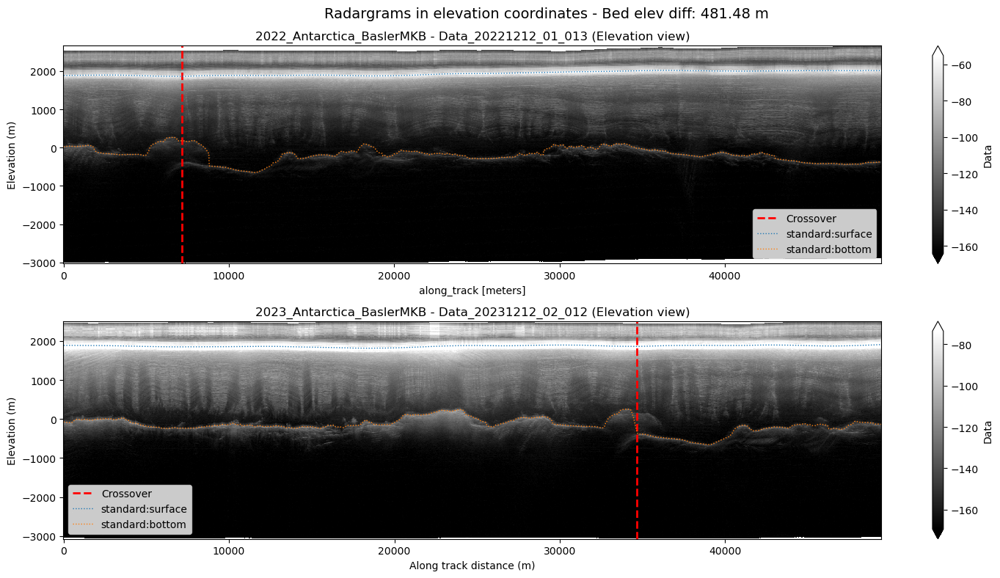

In [25]:
clb_min_pct, clb_max_pct = 30, 97

# Plot radargrams in elevation coordinates with layers
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8))

# Frame 1 radargram in elevation
pwr_1_elev = 10*np.log10(np.abs(frame_1.Data))
vmax_1 = np.percentile(pwr_1_elev, clb_max_pct)
vmin_1 = np.percentile(pwr_1_elev, clb_min_pct)
pwr_1_elev.plot.imshow(x='along_track', y='wgs84', cmap='gray', ax=ax1, vmin=vmin_1, vmax=vmax_1)
ax1.axvline(frame_1.along_track[idx_1].values, color='red', linestyle='--', linewidth=2, label='Crossover')

# Plot layers using elevation data
for layer_name in layers_1:
    layers_1[layer_name]['wgs84'].plot(ax=ax1, x='along_track', linewidth=1, linestyle=':', label=layer_name)

ax1.set_title(f"{intersect['collection_1']} - {intersect['id_1']} (Elevation view)")
ax1.set_ylabel('Elevation (m)')
ax1.legend()

# Frame 2 radargram in elevation
pwr_2_elev = 10*np.log10(np.abs(frame_2.Data))
vmax_2 = np.percentile(pwr_2_elev, clb_max_pct)
vmin_2 = np.percentile(pwr_2_elev, clb_min_pct)
pwr_2_elev.plot.imshow(x='along_track', y='wgs84', cmap='gray', ax=ax2, vmin=vmin_2, vmax=vmax_2)
ax2.axvline(frame_2.along_track[idx_2].values, color='red', linestyle='--', linewidth=2, label='Crossover')

# Plot layers using elevation data
for layer_name in layers_2:
    layers_2[layer_name]['wgs84'].plot(ax=ax2, x='along_track', linewidth=1, linestyle=':', label=layer_name)

ax2.set_title(f"{intersect['collection_2']} - {intersect['id_2']} (Elevation view)")
ax2.set_xlabel('Along track distance (m)')
ax2.set_ylabel('Elevation (m)')
ax2.legend()

plt.suptitle(f"Radargrams in elevation coordinates - Bed elev diff: {intersect['elev_diff']:.2f} m", fontsize=14)
plt.tight_layout()
plt.show()

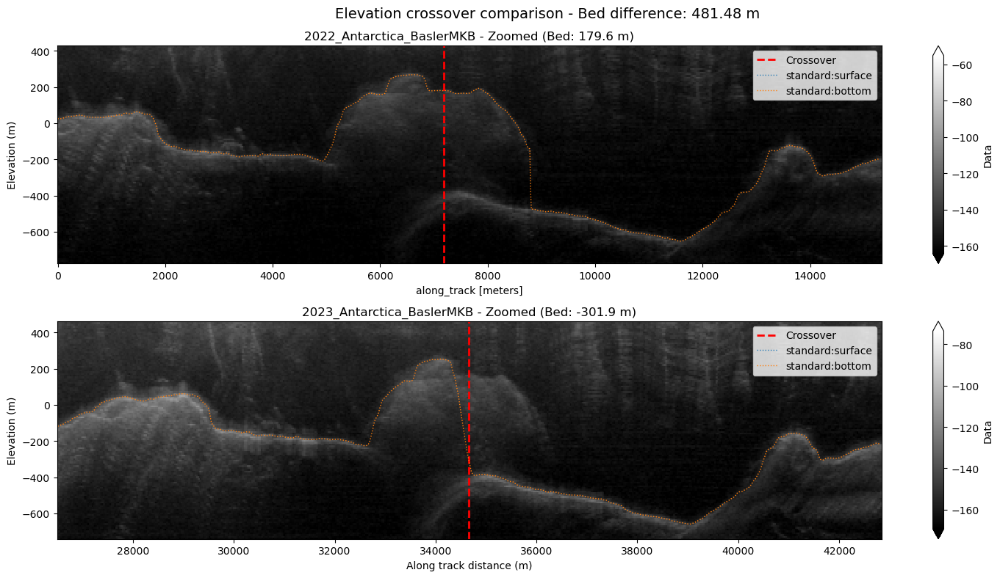

In [26]:
# Zoomed elevation plots around crossover
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8))

window_size = 300  # Number of traces on each side of intersection
elev_window = np.maximum(intersect['elev_diff']*2.5, 100)  # Elevation window in meters around bed

# Frame 1 zoomed
idx_start_1 = max(0, idx_1 - window_size)
idx_end_1 = min(len(frame_1.slow_time), idx_1 + window_size)

# Convert indices to slow_time values for layer slicing
slow_time_start_1 = frame_1.slow_time[idx_start_1]
slow_time_end_1 = frame_1.slow_time[idx_end_1 - 1]

pwr_1_zoom = frame_1.Data.isel(slow_time=slice(idx_start_1, idx_end_1))
pwr_1_zoom_db = 10*np.log10(np.abs(pwr_1_zoom))
pwr_1_zoom_db.plot.imshow(x='along_track', y='wgs84', cmap='gray', ax=ax1, vmin=vmin_1, vmax=vmax_1)
ax1.axvline(frame_1.along_track[idx_1].values, color='red', linestyle='--', linewidth=2, label='Crossover')

# Plot layers using the layers_1 dictionary
for layer_name in layers_1:
    layer_zoom = layers_1[layer_name]['wgs84'].sel(slow_time=slice(slow_time_start_1, slow_time_end_1))
    layer_zoom.plot(ax=ax1, x='along_track', linewidth=1, linestyle=':', label=layer_name)

# Set y-limits based on bed layer if available
if 'standard:bottom' in layers_1:
    bed_elev_1 = layers_1['standard:bottom']['wgs84'].isel(slow_time=idx_1).values
    elev_min_1 = bed_elev_1 - elev_window/2
    elev_max_1 = bed_elev_1 + elev_window/2
    ax1.set_ylim(elev_min_1, elev_max_1)

ax1.set_title(f"{intersect['collection_1']} - Zoomed (Bed: {intersect['wgs84_1']:.1f} m)")
ax1.set_ylabel('Elevation (m)')
ax1.legend()

# Frame 2 zoomed
idx_start_2 = max(0, idx_2 - window_size)
idx_end_2 = min(len(frame_2.slow_time), idx_2 + window_size)

# Convert indices to slow_time values for layer slicing
slow_time_start_2 = frame_2.slow_time[idx_start_2]
slow_time_end_2 = frame_2.slow_time[idx_end_2 - 1]

pwr_2_zoom = frame_2.Data.isel(slow_time=slice(idx_start_2, idx_end_2))
pwr_2_zoom_db = 10*np.log10(np.abs(pwr_2_zoom))
pwr_2_zoom_db.plot.imshow(x='along_track', y='wgs84', cmap='gray', ax=ax2, vmin=vmin_2, vmax=vmax_2)
ax2.axvline(frame_2.along_track[idx_2].values, color='red', linestyle='--', linewidth=2, label='Crossover')

# Plot layers using the layers_2 dictionary
for layer_name in layers_2:
    layer_zoom = layers_2[layer_name]['wgs84'].sel(slow_time=slice(slow_time_start_2, slow_time_end_2))
    layer_zoom.plot(ax=ax2, x='along_track', linewidth=1, linestyle=':', label=layer_name)

# Set y-limits based on bed layer if available
if 'standard:bottom' in layers_2:
    bed_elev_2 = layers_2['standard:bottom']['wgs84'].isel(slow_time=idx_2).values
    elev_min_2 = bed_elev_2 - elev_window/2
    elev_max_2 = bed_elev_2 + elev_window/2
    ax2.set_ylim(elev_min_2, elev_max_2)

ax2.set_title(f"{intersect['collection_2']} - Zoomed (Bed: {intersect['wgs84_2']:.1f} m)")
ax2.set_xlabel('Along track distance (m)')
ax2.set_ylabel('Elevation (m)')
ax2.legend()

plt.suptitle(f"Elevation crossover comparison - Bed difference: {intersect['elev_diff']:.2f} m", fontsize=14)
plt.tight_layout()
plt.show()

In [30]:
layers_2

{'standard:surface': <xarray.Dataset> Size: 220kB
 Dimensions:       (slow_time: 3332)
 Coordinates:
     layer         uint8 1B 1
   * slow_time     (slow_time) datetime64[ns] 27kB 2023-12-12T06:02:42.3238394...
     along_track   (slow_time) float64 27kB 0.0 14.83 ... 4.941e+04 4.942e+04
 Data variables:
     file_type     <U5 20B 'layer'
     file_version  <U1 4B '1'
     elev          (slow_time) float64 27kB 2.476e+03 2.476e+03 ... 2.497e+03
     id            uint8 1B 1
     Latitude      (slow_time) float64 27kB -75.42 -75.42 ... -74.99 -74.99
     Longitude     (slow_time) float64 27kB 155.6 155.6 155.6 ... 155.1 155.1
     quality       (slow_time) uint8 3kB 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1
     twtt          (slow_time) float64 27kB 3.93e-06 3.93e-06 ... 3.94e-06
     type          (slow_time) uint8 3kB 2 2 2 2 2 2 2 2 2 ... 2 2 2 2 2 2 2 2 2
     wgs84         (slow_time) float64 27kB 1.887e+03 1.887e+03 ... 1.907e+03
     range         (slow_time) float64 27kB 589.1 

In [37]:
frame_2

<xarray.Dataset> Size: 4MB
Dimensions:      (slow_time: 1818, wgs84: 558)
Coordinates:
  * slow_time    (slow_time) datetime64[ns] 15kB 2023-12-12T06:02:42.23846530...
    along_track  (slow_time) float64 15kB 0.0 27.18 ... 4.941e+04 4.943e+04
  * wgs84        (wgs84) float64 4kB -3.068e+03 -3.058e+03 ... 2.502e+03
Data variables:
    Data         (slow_time, wgs84) float32 4MB -1.0 -1.0 ... 7.227e-14 -2.0
    Bottom       (slow_time) float64 15kB ...
    Elevation    (slow_time) float64 15kB ...
    Heading      (slow_time) float64 15kB ...
    Latitude     (slow_time) float64 15kB -75.42 -75.42 -75.42 ... -74.99 -74.99
    Longitude    (slow_time) float64 15kB 155.6 155.6 155.6 ... 155.1 155.1
    Pitch        (slow_time) float64 15kB ...
    Roll         (slow_time) float64 15kB ...
    Surface      (slow_time) float64 15kB ...
Attributes: (12/31)
    file_version:         49
    radiometric_corr_dB:  nan
    file_type:            [ 97 114 114  97 121]
    source_url:           https://data.cresis.ku.edu/data/rds/2023_Antarctica...
    Conventions:          CF-1.8
    title:                Radar Echogram Data
    ...                   ...
    ror:                  00hj54h04
    funder_text:          This work was supported by the Center for Oldest Ic...
    mimetype:             application/x-hdf5
    param_array:          {'array': {'DCM': {'bin_rng': array(-0.), 'line_rng...
    param_records:        {'array': {'bin_rng': array(0.), 'dline': array(11....
    param_sar:            {'array': {'bin_rng': array(0.), 'dline': array(11....

In [41]:
frame_2['wgs84'].data

array([-3.06844465e+03, -3.05844465e+03, -3.04844465e+03, -3.03844465e+03,
       -3.02844465e+03, -3.01844465e+03, -3.00844465e+03, -2.99844465e+03,
       -2.98844465e+03, -2.97844465e+03, -2.96844465e+03, -2.95844465e+03,
       -2.94844465e+03, -2.93844465e+03, -2.92844465e+03, -2.91844465e+03,
       -2.90844465e+03, -2.89844465e+03, -2.88844465e+03, -2.87844465e+03,
       -2.86844465e+03, -2.85844465e+03, -2.84844465e+03, -2.83844465e+03,
       -2.82844465e+03, -2.81844465e+03, -2.80844465e+03, -2.79844465e+03,
       -2.78844465e+03, -2.77844465e+03, -2.76844465e+03, -2.75844465e+03,
       -2.74844465e+03, -2.73844465e+03, -2.72844465e+03, -2.71844465e+03,
       -2.70844465e+03, -2.69844465e+03, -2.68844465e+03, -2.67844465e+03,
       -2.66844465e+03, -2.65844465e+03, -2.64844465e+03, -2.63844465e+03,
       -2.62844465e+03, -2.61844465e+03, -2.60844465e+03, -2.59844465e+03,
       -2.58844465e+03, -2.57844465e+03, -2.56844465e+03, -2.55844465e+03,
       -2.54844465e+03, -

In [40]:
frame_2["Elevation"].data

array([2475.79399639, 2475.71060148, 2475.61114093, ..., 2497.69124581,
       2497.44797617, 2497.19825516], shape=(1818,))

In [42]:
frame_2['wgs84'].data - frame_2["Elevation"].data

ValueError: operands could not be broadcast together with shapes (558,) (1818,) 